<a href="https://colab.research.google.com/github/Piyumi22/UCSD-Microgrid-Database/blob/master/EDA_PVGeneration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 0.Importing the Libraries

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import random

import matplotlib.pyplot as plt
import os

import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.offline as pyo

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# EDA on PV data

#1. pandas profiling

In [3]:
!pip install pandas_profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.3/356.3 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 8.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 19.1 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27079 sha256=8d0818763d90571d09ee10c673be3ca0316d41f0255b5e645eb92390ddb8ae1a
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: wordcloud
    Found existing installation: wordcloud 1.8.2.2
    Uninstalling wordc

In [4]:
import os
import pandas as pd
import pandas_profiling

# Specify the path to the folder in Google Drive for saving the reports
output_folder = '/content/drive/MyDrive/FYRP/ME420-RESEARCH/UCSD Microgrid Database/pandas profiling reports/PVGenerator'

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Specify the path to the folder containing the CSV files
folder_path = '/content/drive/MyDrive/FYRP/ME420-RESEARCH/UCSD Microgrid Database/Data Files/PVGenerator'

# Get a list of all files in the folder
file_list = os.listdir(folder_path)

# List to store the URL links
url_links = []

# Loop through the files and perform desired operations
for file_name in file_list:
    # Check if the file is a CSV file
    if file_name.endswith('.csv'):
        # Create the file path
        file_path = os.path.join(folder_path, file_name)

        # Read the CSV file using pandas
        df = pd.read_csv(file_path)

        # Generate pandas profiling report
        profile = pandas_profiling.ProfileReport(df)

        # Specify the file name for the report
        report_name = f"{file_name}_profile_report.html"

        # Construct the full file path for the report in the output folder
        report_path = os.path.join(output_folder, report_name)

        # Save the profile report as an HTML file
        profile.to_file(report_path)

        # Create the URL link to the report in Google Drive
        url_link = f'file://{report_path}'

        # Add the URL link to the list
        url_links.append(url_link)

# Print the URL links
print("HTML links generated:")
for link in url_links:
    print(link)


<ipython-input-4-4455310a4cda>:3: DeprecationWarning:

`import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

HTML links generated:
file:///content/drive/MyDrive/FYRP/ME420-RESEARCH/UCSD Microgrid Database/pandas profiling reports/PVGenerator/EBU2_A_PV.csv_profile_report.html
file:///content/drive/MyDrive/FYRP/ME420-RESEARCH/UCSD Microgrid Database/pandas profiling reports/PVGenerator/EBU2_B_PV.csv_profile_report.html
file:///content/drive/MyDrive/FYRP/ME420-RESEARCH/UCSD Microgrid Database/pandas profiling reports/PVGenerator/ElectricShopPV.csv_profile_report.html
file:///content/drive/MyDrive/FYRP/ME420-RESEARCH/UCSD Microgrid Database/pandas profiling reports/PVGenerator/GarageFleetsPV.csv_profile_report.html
file:///content/drive/MyDrive/FYRP/ME420-RESEARCH/UCSD Microgrid Database/pandas profiling reports/PVGenerator/HopkinsParkingPV.csv_profile_report.html
file:///content/drive/MyDrive/FYRP/ME420-RESEARCH/UCSD Microgrid Database/pandas profiling reports/PVGenerator/PriceCenterA_PV.csv_profile_report.html
file:///content/drive/MyDrive/FYRP/ME420-RESEARCH/UCSD Microgrid Database/pandas prof

# 2.Data preparation


##2.1 filewise box plot

(no need)

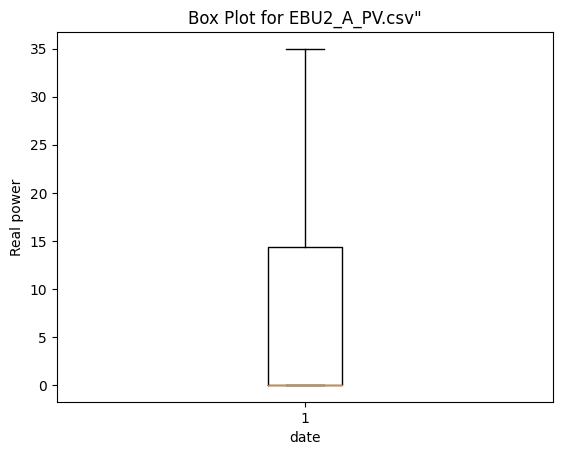

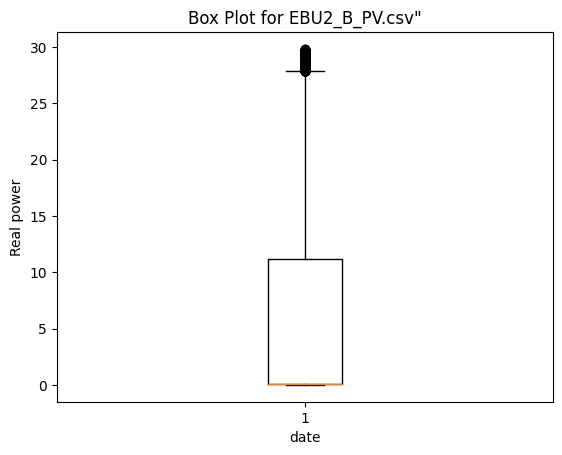

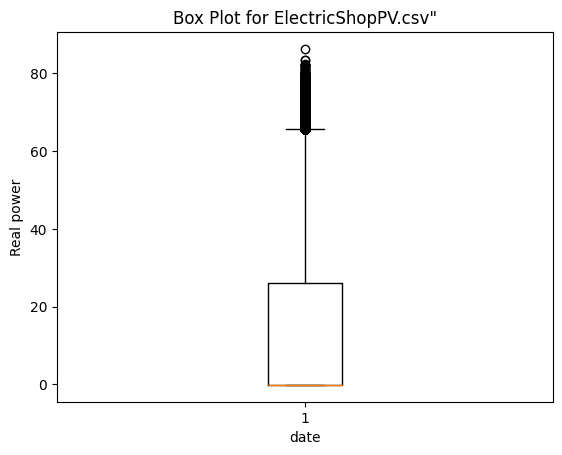

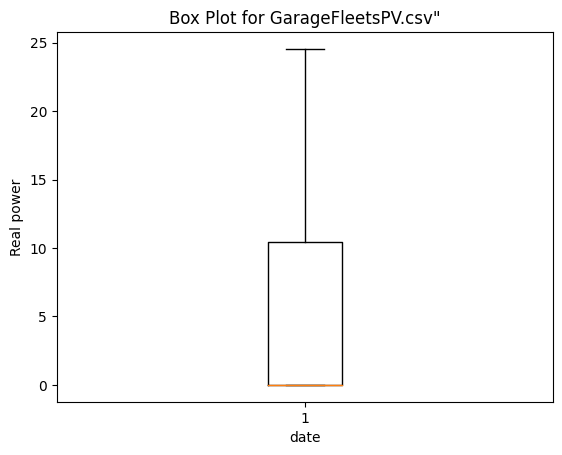

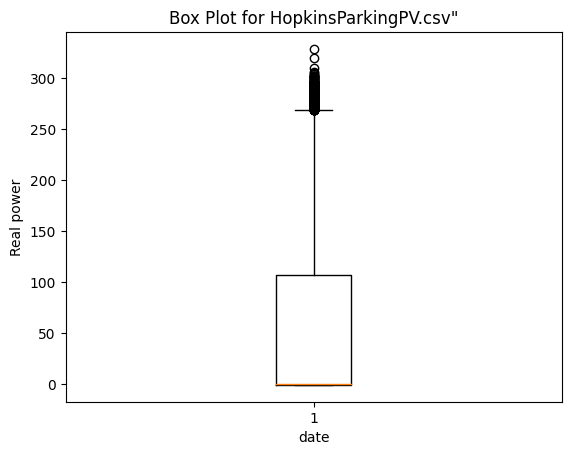

...

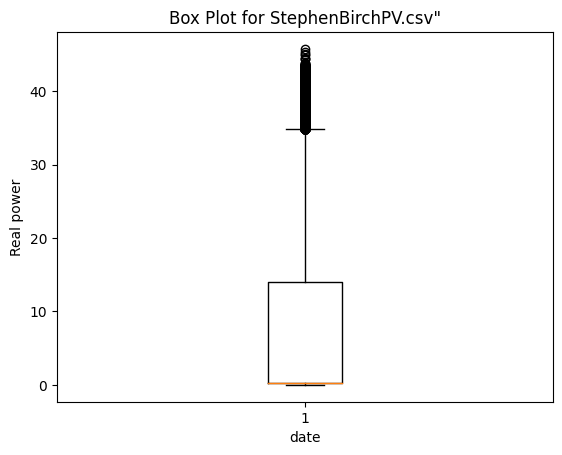

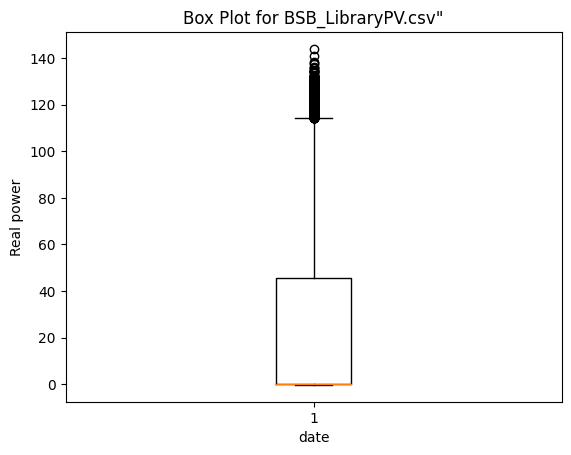

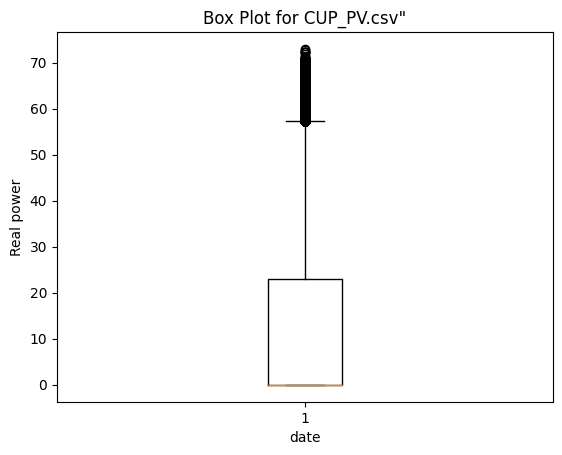

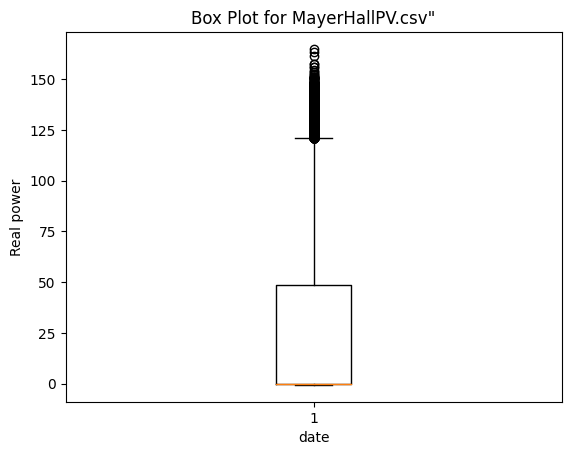

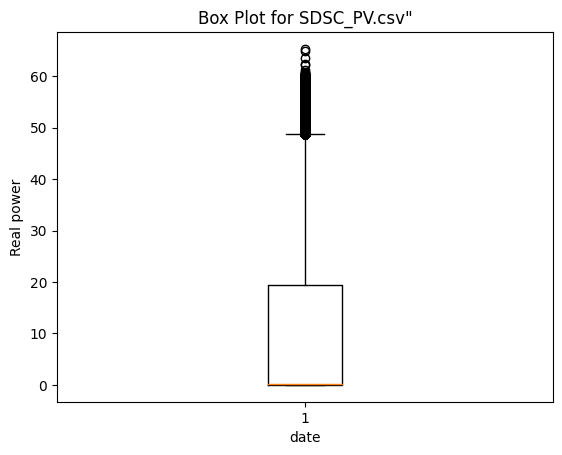

In [5]:
# Specify the path to the folder in your Google Drive
folder_path = '/content/drive/MyDrive/FYRP/ME420-RESEARCH/UCSD Microgrid Database/Data Files/PVGenerator'

# Get a list of all files in the folder
file_list = os.listdir(folder_path)
data = []  # List to store the data from each file

#add the data from each file to the list
for file_name in file_list:
    if file_name.endswith('.csv'):

            file_path = os.path.join(folder_path, file_name)
                # Read the CSV file using pandas
            df = pd.read_csv(file_path)

            # Extract the column of interest from the DataFrame
            column_name = 'RealPower'  # Replace with the name of the column you want to plot
            column_data = df[column_name]

            # Plotting
            plt.boxplot(column_data)
            plt.xlabel('date')
            plt.ylabel('Real power')
            plt.title(f'Box Plot for {file_name}"')
            plt.show()

            data.append(df)

#Concatenate the data from all the files into a single DataFrame
combined_data = pd.concat(data)


##2.2 combined data box plot

In [6]:
# Specify the path to the folder containing the CSV files
folder_path = '/content/drive/MyDrive/FYRP/ME420-RESEARCH/UCSD Microgrid Database/Data Files/PVGenerator'

# Get a list of all files in the folder
file_list = os.listdir(folder_path)

# Create an empty DataFrame to store the combined data
combined_data = pd.DataFrame()

# Read each CSV file and add 'RealPower' column to the combined DataFrame based on 'DateTime'
for file_name in file_list:
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        df = pd.read_csv(file_path)
        df = df[['DateTime', 'RealPower']]  # Select only the 'DateTime' and 'RealPower' columns
        df['DateTime'] = pd.to_datetime(df['DateTime'])  # Convert 'DateTime' column to datetime format
        df = df.drop_duplicates(subset='DateTime')  # Remove duplicate values in 'DateTime' column
        df.set_index('DateTime', inplace=True)  # Set 'DateTime' as the index
        combined_data[file_name] = df['RealPower']

# Generate the box plot using Plotly
data = []
for column in combined_data.columns:
    data.append(go.Box(name=column, y=combined_data[column]))

layout = go.Layout(
    title='Box Plot of Real Power',
    xaxis=dict(title='Files'),
    yaxis=dict(title='Real Power')
)

fig = go.Figure(data=data, layout=layout)
fig.show()

In [7]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.offline as pyo

fig = make_subplots(rows=len(combined_data.columns), cols=1, shared_xaxes=True)

# Add line plots for each column
for i, column in enumerate(combined_data.columns):
    fig.add_trace(go.Scatter(x=combined_data.index, y=combined_data[column], mode='lines', name=column), row=i+1, col=1)

# Update the layout and show the plot
fig.update_layout(title='Line Plots for Power Data', xaxis_title='DateTime', yaxis_title='Power')
fig.show()

## 2.3 mean value as data
taking mean value corespond to same datetime of different places

In [ ]:
# Specify the path to the folder in your Google Drive
folder_path = '/content/drive/MyDrive/FYRP/ME420-RESEARCH/UCSD Microgrid Database/Data Files/PVGenerator'

# Get a list of all files in the folder
file_list = os.listdir(folder_path)

# Create an empty DataFrame to store the combined data
combined_data_Mean = pd.DataFrame()

# Read each CSV file and add 'RealPower' column to the combined DataFrame based on 'DateTime'
i=0
for file_name in file_list:
    if i>=3:
      break

    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        df = pd.read_csv(file_path)
        df = df[['DateTime', 'RealPower']]  # Select only the 'DateTime' and 'RealPower' columns
        df['DateTime'] = pd.to_datetime(df['DateTime'])  # Convert 'DateTime' column to datetime format

        df = df.drop_duplicates(subset='DateTime')  # Remove duplicate values in 'DateTime' column
        df.set_index('DateTime', inplace=True)  # Set 'DateTime' as the index


          # Replace NaN values with the next non-null value (backward-fill) in the DataFrame
        #df['RealPower'] = df['RealPower'].fillna(method='bfill')
          # Replace NaN values with the previous non-null value (forward-fill) in the 'RealPower' column
        #df['RealPower'] = df['RealPower'].fillna(method='ffill')

        # Add the 'RealPower' data to the combined DataFrame
        combined_data_Mean = pd.concat([combined_data_Mean, df['RealPower']], axis=1)
        i=i+1

# Calculate the mean along the columns (axis=1) and add it as a new column
combined_data_Mean['MeanPower'] = combined_data_Mean.mean(axis=1)

# Sort the DataFrame by the 'DateTime' index
combined_data_Mean = combined_data_Mean.sort_index()

# Print the combined DataFrame with the new column
print(combined_data_Mean)



In [ ]:
from google.colab import data_table
data_table.DataTable(combined_data_Mean)

In [ ]:
# print the last 200 rows of the combined_data_Mean DataFrame
data_table.DataTable(combined_data_Mean.tail(2000))


In [ ]:
# Create a box plot of the mean data
fig = px.box(combined_data_Mean, y='MeanPower', title='Box Plot of Mean Power')
fig.update_layout(xaxis_title='Mean Power', yaxis_title='Value')
fig.show()


In [ ]:
# Create the line plot for the MeanPower column using Plotly
fig = go.Figure()
fig.add_trace(go.Scatter(x=combined_data_Mean.index, y=combined_data_Mean['MeanPower'], mode='lines', name='Mean Power'))

# Update the layout
fig.update_layout(title='Line Plot for Mean Power', xaxis_title='DateTime', yaxis_title='Mean Power')

# Show the plot
fig.show()

In [ ]:
print(combined_data_Mean.columns)

## mean data for modeling

In [ ]:
SD_series = combined_data_Mean['MeanPower']

# Convert the Series to a DataFrame
SD = SD_series.to_frame()

# Convert the index to datetime format
SD.index=pd.to_datetime(SD.index)

data_table.DataTable(SD)
#print(SD)

In [ ]:
SD.describe()

# 3.BASELINE MODELS for PV generation

## 1. Setting up the dataset

In [ ]:
# Define the train, validation, and test set sizes
train_size = 0.8  # 90% of the data for training
test_size = 0.2 # 10% of the data for testing

# Calculate the indices for train, validation, and test sets
num_samples = len(SD)
train_index = int(train_size * num_samples)


# Split the dataset into train, validation, and test sets
train_data = SD.iloc[:train_index]
test_data = SD.iloc[train_index:]

In [ ]:
train_data.head()

In [ ]:
# get the min value and max value of the train dataset
min_val = train_data.min()
max_val = train_data.max()

In [ ]:
print(min_val)
print(max_val)

In [ ]:
test_data.head()


In [ ]:
print(test_data.index)
#SD.index.to_numpy()

In [ ]:
test_unix = test_data.copy()

# Convert DateTime index to Unix timestamp
test_unix['UnixTimestamp'] = test_unix.index.astype(int) // 10**9

# Reset the index to restore the 'DateTime' column
test_unix.reset_index(inplace=True)

# Print the DataFrame
test_unix.head()


In [ ]:
# convert the DateTime column to Unix time stamp
train_unix = train_data.copy()
# Convert DateTime column to Unix timestamp
train_unix['UnixTimestamp'] = train_unix.index.astype(int) // 10**9

# Drop the original DateTime column
train_unix.reset_index(inplace=True)

train_unix.head()

## 2. Random Guessing Baseline model

In [ ]:
import random
import numpy as np

class RandomGuessingModel:
    def __init__(self, min_value, max_value):
        self.min_value = min_value
        self.max_value = max_value

    def train(self, train_data):
        # No training is required for a random guessing model
        pass

    def predict(self, test_data):
        predictions = []
        for _ in test_data:
            random_value = random.uniform(self.min_value, self.max_value)
            predictions.append(random_value)
        return np.array(predictions)

# Create an instance of the RandomGuessingModel with specified min and max values
model = RandomGuessingModel(min_value=min_val, max_value=max_val)

# Make predictions on the test data (test_unix['UnixTimestamp'] contains the timestamp array)
predictions = model.predict(test_unix['UnixTimestamp'])

# Print the predictions
print(predictions)


In [ ]:
class RandomGuessingModel:
    def __init__(self, min_value, max_value):
        self.min_value = min_value
        self.max_value = max_value

    def train(self, train_data):
        # No training is required for a random guessing model
        pass

    def predict(self, test_data):
        predictions = []
        for _ in test_data:
            random_value = random.uniform(self.min_value, self.max_value)
            predictions.append(random_value[1])
        return np.array(predictions)

### Evaluating the Baseline Random guessing model

In [ ]:
test = test_unix['MeanPower'].values

# Calculate the RMSE
rmse = np.sqrt(mean_squared_error(test, predictions))

# Print the RMSE
print("RMSE:", rmse)

## 3. Average Baseline model

In [ ]:
class AverageBaselineModel:
    def __init__(self):
        self.average = None

    def train(self, train_data):
        # Calculate the average of the target variable
        self.average = np.mean(train_data)

    def predict(self, test_data):
        # Create an array of the same length as test_data with the calculated average
        predictions = np.full(len(test_data), self.average)
        return predictions


In [ ]:
# Create an instance of the AverageBaselineModel
model = AverageBaselineModel()

# Train the model by calculating the average
model.train((train_data["MeanPower"].values))

# Make predictions on the test data
predictions = model.predict(test_unix['UnixTimestamp'])

# Print the predictions
print(predictions)

### Evaluating the average Baseline model

In [ ]:
test = test_unix['MeanPower'].values

# Calculate the RMSE
rmse = np.sqrt(mean_squared_error(test, predictions))

# Print the RMSE
print("RMSE:", rmse)

#wind data


https://meteostat.net/en/station/72290?t=2018-12-04/2018-12-04